<img src="https://storage.cloud.google.com/mbdm-icemd/icemd.png?authuser=1&supportedpurview=project">

# MBDM Modulo 5: Churn Prediction

#### 138070

## Introduccion

<img src="https://storage.cloud.google.com/mbdm-icemd/linea.png?authuser=1&supportedpurview=project">

El problema del churn es un problema que afecta a todas las compañías, pero en especial a las Telcos, con una tasa superior al 30% debido a la alta competencia entre ellas y la gran facilidad de cambiar de una a otra
compañía.
Según un estudio de Daemon Quest, retener a un cliente cuesta entre cinco y quince veces menos que captar a uno nuevo. Es por ello por lo que las telcos, al igual que otras compañías, están poniendo mucho interés en la retención
de los clientes.

 El objetivo de este NoteBook es predecir el comportamiento de los clientes para su posterior retencion en la compañia. Para ello se analizarán todos los datos relevantes de los clientes descargados en el siguiete enlace:

 https://www.kaggle.com/blastchar/telco-customer-churn

## Descripcion del DataSet 

<img src="https://storage.cloud.google.com/mbdm-icemd/linea.png?authuser=1&supportedpurview=project">

Esta descripción del data set es dada por el enunciado, posteriormente analizaremos paso a paso los datos del enunciado.

Cada fila representa un cliente, cada columna contiene atributos de cliente descritos en la columna Metadata.
Los datos brutos contienen **7043 filas** (clientes) y **21 columnas**(variables/atributos).
La Columna **“Churn”** es nuestro target.
* **CustomerID** (Alfanumérica): Customer ID
* **Gender** (Alfanumérica) si el clientes es hombre se codifica con “male” y si es mujer con “female”
* **SeniorCitizen** (numérica): si el cliente es senior o no (1,0)
* **Partner** (Alfanumérica): Si el cliente tiene un partner o no (Yes,No)
* **Dependents** (Alfanumérica): si el cliente tiene dependientes o no (yes,No)
* **Ternure** (numérica): número de meses que el cliente ha estado en la compañía
* **PhoneService** (Alfanumérica): Si el cliente tiene un servicio móvil o no (Yes,No)
* **MultipleLines** (Alfanumérica): Si el cliente tiene multiples líneas (Yes, No, No pone service)
* **InternetService** (Alfanumérica): Proveedor de servicio de internet del cliente (DSL,Fiber optic, No)
* **OnlineSecurity** (Alfanumérica). Si el cliente tiene seguridad online o no (Yes,No, No internet service)
* **OnlineBackup** (Alfanumérica). Si el cliente tiene backup online o no (Yes,No, No internet service)
* **DeviceProtection** (Alfanumérica). Si el cliente tiene protección para el sispositivo o no (Yes, No, No internet service)
* **TechSupport** (Alfanumérica): Si el cliente tien soporte o no (Yes, No, No internet service)
* **StreamingTV** (Alfanumérica). Si el cliente tiene TV en streaming o no (Yes, No, No internet sercice)
* **StreamingMovies** (Alfanumérica). Si el cliente tiene películas en streaming o no (Yes, No, No internet service)
* **Contract** (Alfanumérica). Los términos del contrato del cliente. (Month-toMonth, One year, Two year)
* **PaperlessBilling** (Alfanumérica). Si el cliente tiene factura digital o no (Yes, No)
* **PaymentMethod** (Alfanumérica). El método de pago del cliente.(Electronic check, Mailed check, Bank transfer (automatic), Credit card (automatic)
* **MonthlyCharges** (numérica). La cantidad cargada por el cliente mensualmente
* **TotalCharges** (numérica). La cantidad total cargada al cliente
* **Churn** (Alfanumérica). Si el cliente se ha ido de la compañía o no (Yes o No) 

## Exploracion del DataSet

<img src="https://storage.cloud.google.com/mbdm-icemd/linea.png?authuser=1&supportedpurview=project">

Cargamos el dataset y librerias para su posterior manipulación:

In [1]:
import pandas as pd
import numpy as np

churn =pd.read_csv("WA_Fn-UseC_-Telco-Customer-Churn.csv")
churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
customerID          7043 non-null object
gender              7043 non-null object
SeniorCitizen       7043 non-null int64
Partner             7043 non-null object
Dependents          7043 non-null object
tenure              7043 non-null int64
PhoneService        7043 non-null object
MultipleLines       7043 non-null object
InternetService     7043 non-null object
OnlineSecurity      7043 non-null object
OnlineBackup        7043 non-null object
DeviceProtection    7043 non-null object
TechSupport         7043 non-null object
StreamingTV         7043 non-null object
StreamingMovies     7043 non-null object
Contract            7043 non-null object
PaperlessBilling    7043 non-null object
PaymentMethod       7043 non-null object
MonthlyCharges      7043 non-null float64
TotalCharges        7043 non-null object
Churn               7043 non-null object
dtypes: float64(1), int64(2), obj

Como podemos observar coinciden tanto el numero de columnas como el numero de filas que tenemos en el dataset. Pero el tipo columna no esta definido como tal.
Posteriormente procedemos a pasar las columnas correspondientes de tipo `object` a tipo `float`. Pero antes de ello vamos a explorar un poco el contenido de cada columna y si estas contienen valores nulos.

In [2]:
# Contenido de cada columna
churn.apply(set,axis = 0)

customerID          {1089-HDMKP, 6407-UTSLV, 4464-JCOLN, 8272-ONJL...
gender                                                 {Female, Male}
SeniorCitizen                                                  {0, 1}
Partner                                                     {No, Yes}
Dependents                                                  {No, Yes}
tenure              {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...
PhoneService                                                {No, Yes}
MultipleLines                             {No phone service, No, Yes}
InternetService                                {Fiber optic, DSL, No}
OnlineSecurity                         {No internet service, No, Yes}
OnlineBackup                           {No internet service, No, Yes}
DeviceProtection                       {No internet service, No, Yes}
TechSupport                            {No internet service, No, Yes}
StreamingTV                            {No internet service, No, Yes}
StreamingMovies     

In [3]:
# Conteo de valores nulos
churn.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

Porcentaje de custumer-churn para saber si es posible con el dataset generar la prediccion o debereiamos hacer un tratamiento para generar mas custumer-churn

In [4]:
churn['Churn'].value_counts(sort=True,normalize = True)

No     0.73463
Yes    0.26537
Name: Churn, dtype: float64

## Definición de Variables

<img src="https://storage.cloud.google.com/mbdm-icemd/linea.png?authuser=1&supportedpurview=project">

Tras un pequeño analisis, coincidimos con el enunciado del dataset. El siguiente paso es diferenciar nuestras varibales numericas de las categoricas, y realizar los cambios de tipologia necesarios:

In [5]:
col_id          = ['customerID']
col_churn      = ["Churn"]
col_numericas   = ['tenure','MonthlyCharges','TotalCharges']
col_categoricas = ['gender', 'SeniorCitizen', 'Partner', 'Dependents','PhoneService', 'MultipleLines', 
                   'InternetService','OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
                   'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling','PaymentMethod']

## Exploración de Variables Numéricas

<img src="https://storage.cloud.google.com/mbdm-icemd/linea.png?authuser=1&supportedpurview=project">

Tras intentar realizar la siguiente operación:
`churn[var_numericas] = churn[var_numericas].astype(float)`
Nos muestra un error, el cual nos indica que dentro de estos numeros hay una string. Si hacemos la vista atras, podemos obvservar que la unica variable que no estaba en formato `float` era `TotalCharges`.

In [6]:
(churn.loc[:,['customerID','TotalCharges']]).sort_values(by =['TotalCharges']).head()

,customerID,TotalCharges
936,5709-LVOEQ,
3826,3213-VVOLG,
4380,2520-SGTTA,
753,3115-CZMZD,
5218,2923-ARZLG,


Para encontrar estos valores hemos ordenado los valores, obligandole a colocar en primer lugar los valores de caracter `string` y por ultimo los tipo `float`

In [7]:
churn[churn.TotalCharges == ' '].loc[:,['TotalCharges']].count()

TotalCharges    11
dtype: int64

Estos valores respresentan un 0.15% del dataSet, con lo cual procedemos a eliminarlos.

In [8]:
churn = churn[churn.TotalCharges != ' ']
churn = churn.reset_index()[churn.columns]
churn[col_numericas] = churn[col_numericas].astype(float)

Una vez eleminado estos outliers, empecemos un analisis gráfico con boxplots y la distribución de los datos

### Boxplot variables numericas

#### Tenure

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
fig, ax = plt.subplots()
fig.set_size_inches(5, 7)
ax = sns.boxplot(x="Churn", y="tenure", data=churn,width=0.3, notch=True)

Si hubieramos hecho un analisis sin la diferencia de churn-custumer no hubieramos visto estos outliers dentro de yes-churn. Como estos datos son escasos no podemos permitirnos el lujo de quitarnoslos, con lo cual vamos a suavizarlos poniendo como toque maximo, el punto maximo de nuestro percentil. Hacemos esto debido a que son muy pocos y ademas no se salen demaisado del marco.

In [10]:
churn['tenure'] = np.where((churn.Churn == 'Yes')&(churn.tenure > 67),69,churn.tenure)

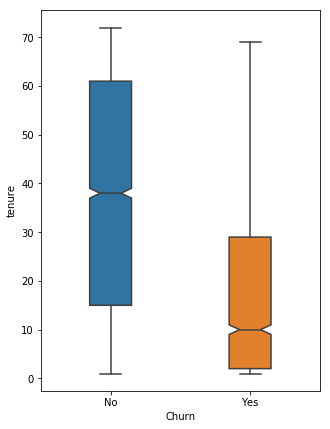

In [11]:
fig, ax = plt.subplots()
fig.set_size_inches(5, 7)
ax = sns.boxplot(x="Churn", y="tenure", data=churn,width=0.3, notch=True)

#### MonthlyCharges

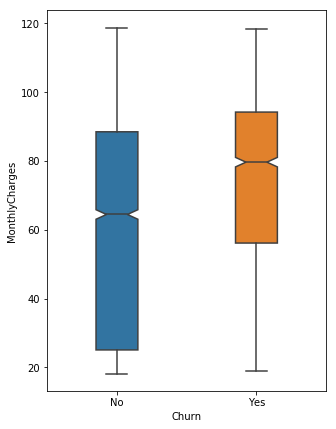

In [12]:
fig, ax = plt.subplots()
fig.set_size_inches(5, 7)
ax = sns.boxplot(x="Churn", y="MonthlyCharges", data=churn,width=0.3, notch=True)

#### TotalCharges

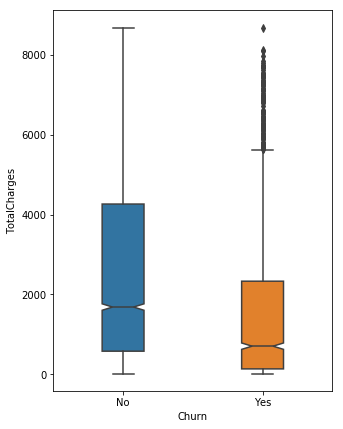

In [13]:
fig, ax = plt.subplots()
fig.set_size_inches(5, 7)
ax = sns.boxplot(x="Churn", y="TotalCharges", data=churn,width=0.3, notch=True)

In [14]:
churn[(churn.Churn == 'Yes')&(churn.TotalCharges > 6800)]

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
104,3192-NQECA,Male,0,Yes,No,69.0,Yes,Yes,Fiber optic,No,...,Yes,Yes,Yes,Yes,Two year,Yes,Bank transfer (automatic),110.00,7611.85,Yes
402,0979-PHULV,Male,0,Yes,Yes,69.0,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,Month-to-month,Yes,Credit card (automatic),99.45,7007.60,Yes
634,7207-RMRDB,Female,0,Yes,Yes,65.0,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,105.50,6985.65,Yes
809,4853-RULSV,Male,0,No,No,69.0,Yes,Yes,Fiber optic,Yes,...,No,Yes,Yes,Yes,Two year,Yes,Credit card (automatic),104.00,7250.15,Yes
972,2834-JRTUA,Male,0,No,No,69.0,Yes,Yes,Fiber optic,Yes,...,Yes,Yes,Yes,Yes,Two year,Yes,Electronic check,108.05,7532.15,Yes
1302,0201-OAMXR,Female,0,No,No,69.0,Yes,Yes,Fiber optic,Yes,...,Yes,Yes,Yes,Yes,One year,No,Credit card (automatic),115.55,8127.60,Yes
1335,3838-OZURD,Male,0,Yes,No,66.0,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,Month-to-month,Yes,Credit card (automatic),105.00,7133.25,Yes
1542,2886-KEFUM,Female,0,Yes,No,63.0,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Electronic check,107.50,6873.75,Yes
1835,6990-YNRIO,Male,0,Yes,Yes,65.0,Yes,Yes,Fiber optic,Yes,...,Yes,Yes,Yes,Yes,Two year,No,Bank transfer (automatic),108.65,6937.95,Yes
2014,7694-VLBWQ,Male,0,Yes,No,67.0,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,No,Electronic check,104.10,7040.85,Yes


Como hemos dicho anteriormente eliminar estos datos no es lo correcto debido a que escasea informacion para los casos de custumer - churn es positivo. Lo que vamamos hacer es suavizar estos datos para que no entorpecer el aprendizaje. Para este caso vamos a colocarle la media de los valores que se salen de lo normal.

In [15]:
churn[(churn.Churn == 'Yes')&(churn.TotalCharges > 6800)].loc[:,['TotalCharges']].mean()

TotalCharges    7337.694792
dtype: float64

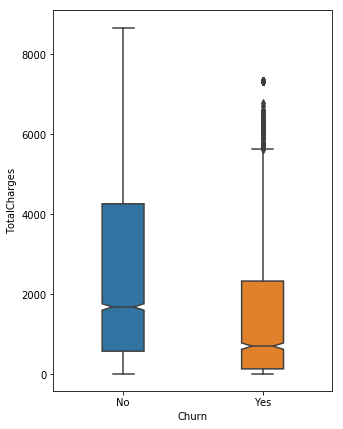

In [16]:
churn['TotalCharges'] = np.where((churn.Churn == 'Yes')&(churn.TotalCharges > 6800),7337.694792,churn.TotalCharges)
fig, ax = plt.subplots()
fig.set_size_inches(5, 7)
ax = sns.boxplot(x="Churn", y="TotalCharges", data=churn,width=0.3, notch=True)

Hemos descubierto que hay un pequeño salto entre los outliers, vamos a utilizar ese salto para cortar.

In [17]:
churn['TotalCharges'] = np.where((churn.Churn == 'Yes')&(churn.TotalCharges > 6500),6500,churn.TotalCharges)

### Variables numéricas/Churn

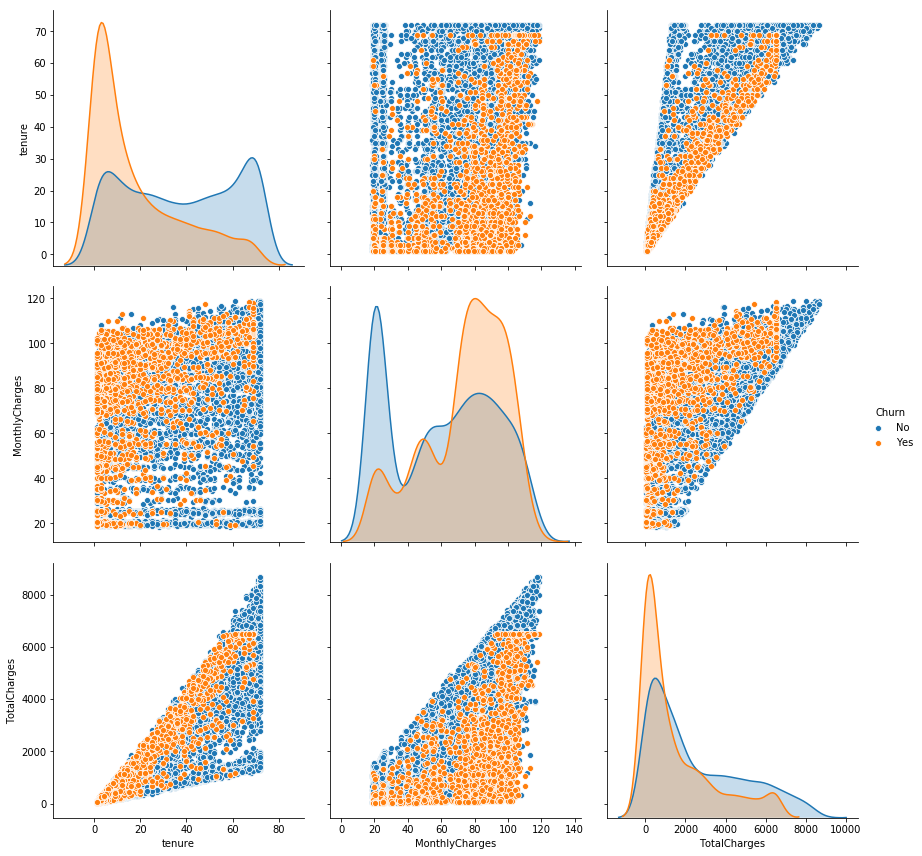

In [18]:
import seaborn as sns
sns.pairplot(churn[col_numericas + col_churn ], kind="scatter", diag_kind= 'kde',height=4, hue="Churn")

* **Tenure** nos indicaba el tiempo de meses que ha estado el cliente en la compañia, como podemos observar las personas que estan entre los 20 primeros meses son los más propensos a irse, es algo logico porque normalmente es el tiempo de permanencia que sueles tener al coger ofertas. Pero si observamos los que no se van se mantienen constantes, pero es normal que sean muchas menos personas de las que suelen irse.
    * **Tenure - MonthlyCharges** : es muy homogenio, pero podemos observar como los puntos naranjas desaparecen cuando tienden a la derecha, debido a que son clientes que siempre mantienen un cosumo alto, por ello se se van en busca de nuvas ofertas.
    * **Tenure - TotalCharges** : Observamos una correlacion que es normal, porque a medida que pasa el tiempo los cargos se van acumulando y sumando. En esta gráfica concluimos nuestra teoria anterior, los clinetes con consumos altos son mas propensos a irse, por eso los puntos estan por encima de los azules.
    
    
* **MonthlyCharges** : Son los cargos mensuales del ciente donde se diferencian dos picos. El primero es debido a las personas con un consumo bajo y se mantienen en la compañia, y el segundo pico es debido a las personas con un alto consumo y acaban marchandose. Aqui observamos perfectamente que las dos tendencias se mantienen en una misma proporcion!
    * **MonthlyCharges - TotalCharges** : Es normal esta correlación de los datos, ya que se refieren al el cúmulo de estos. Y es algo logico que los puntos azules esten un poquito por encima que los narajas, debido que al permanecer mas tiempo en la compañia, los totales son mas altos, pero recalco lo de un poquito, debido que a que el consumo elevado de los que se van, llegan en algunos casos a igualar los montos.
    
    
* **TotalCharges** : Los gastos totales en la compañia se suelen mantener entre los 1500 euros para los dos grupos.

### Variables numéricas/Variables categóricas

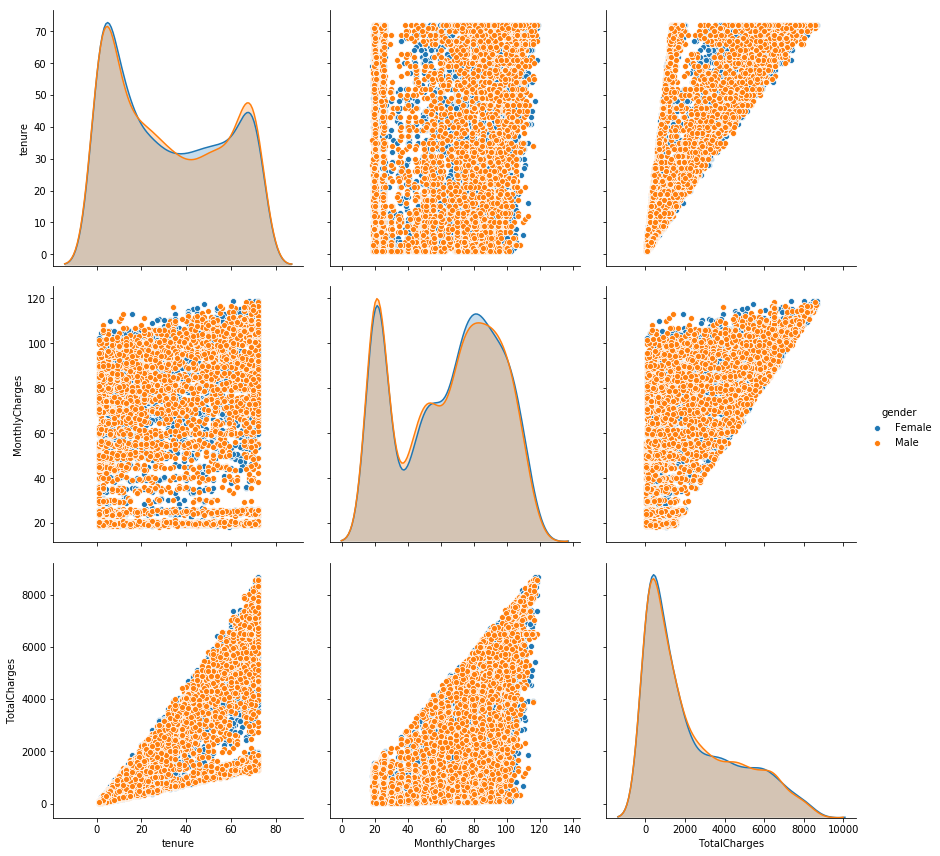

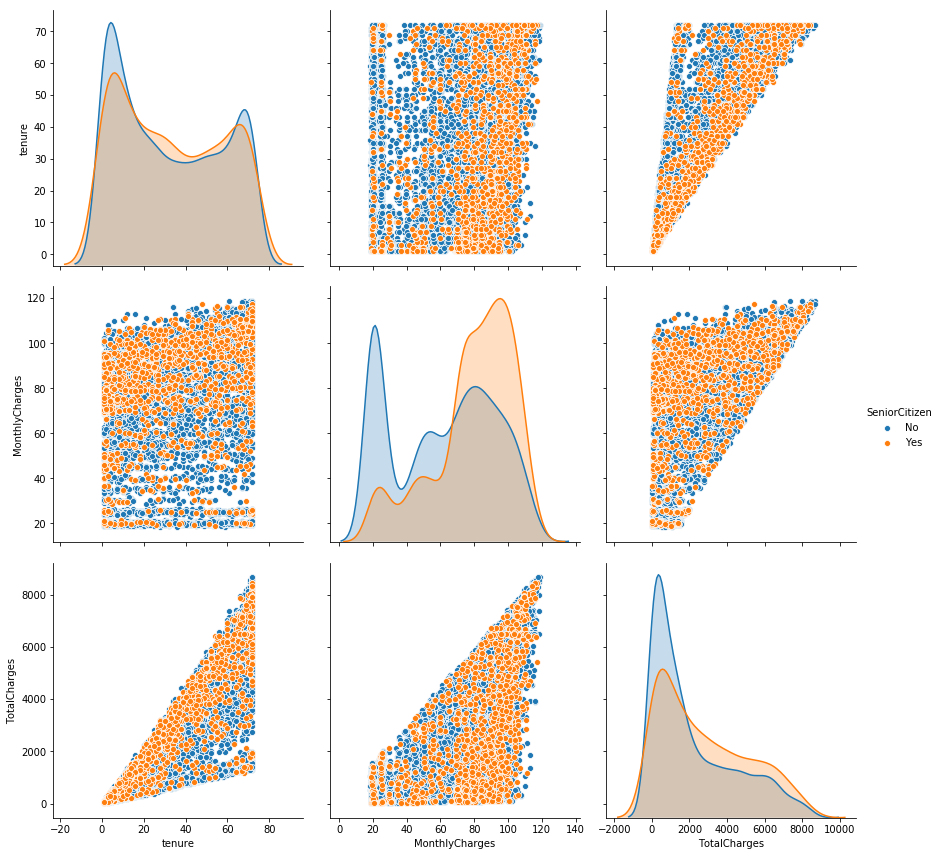

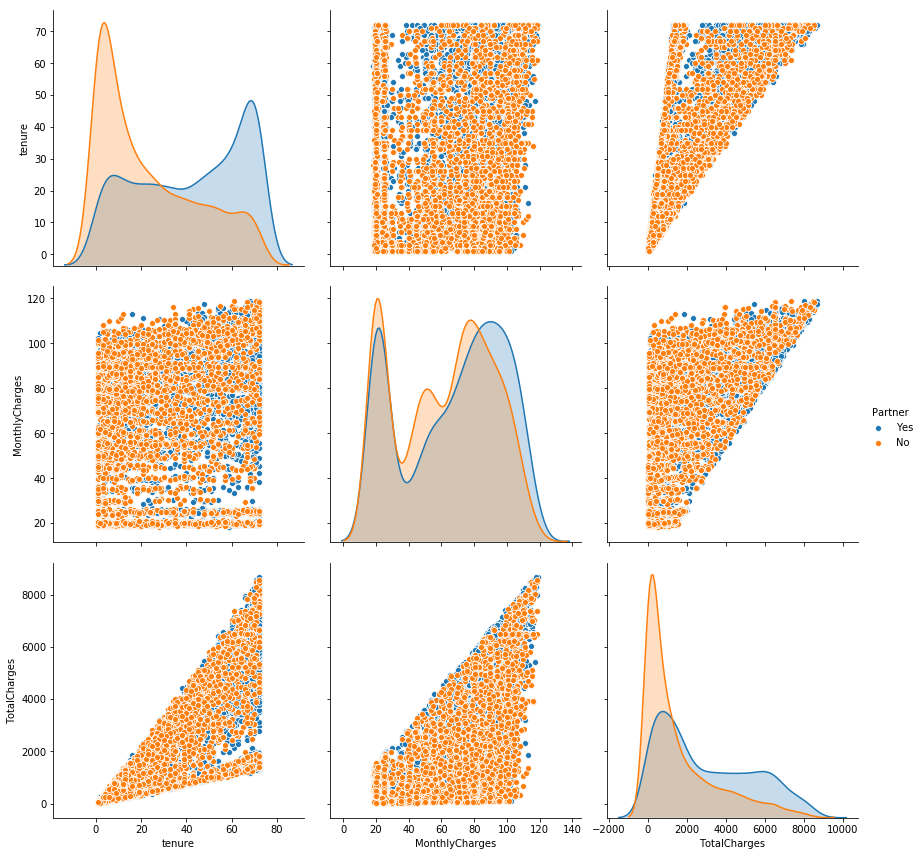

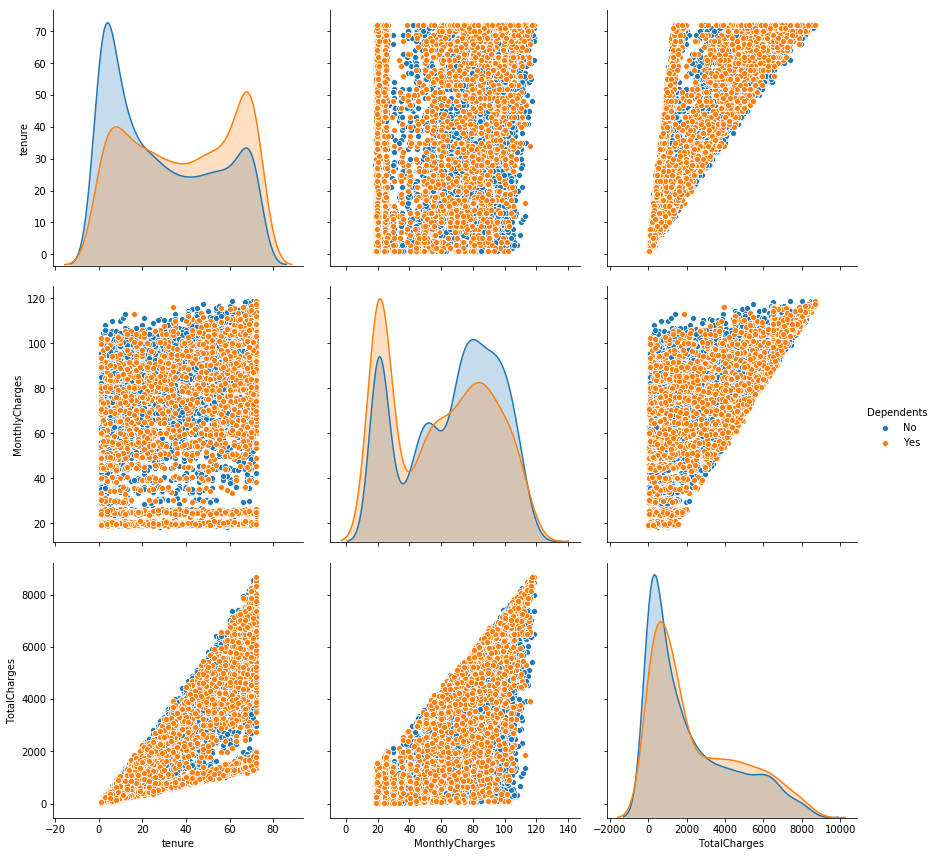

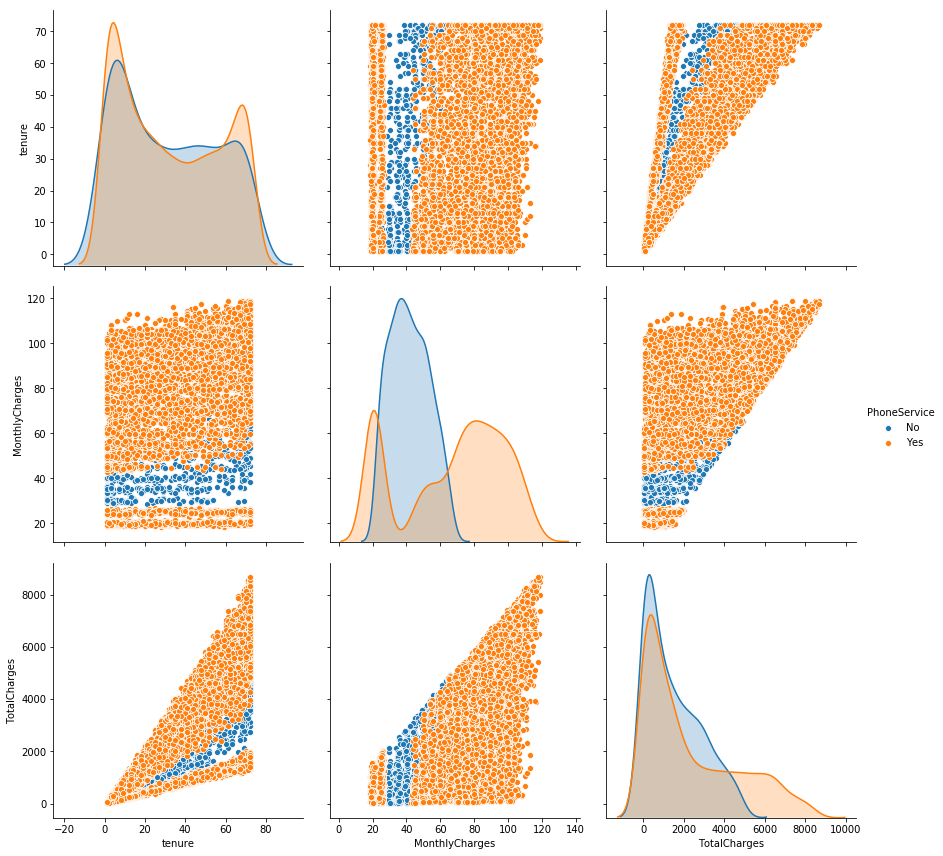

...

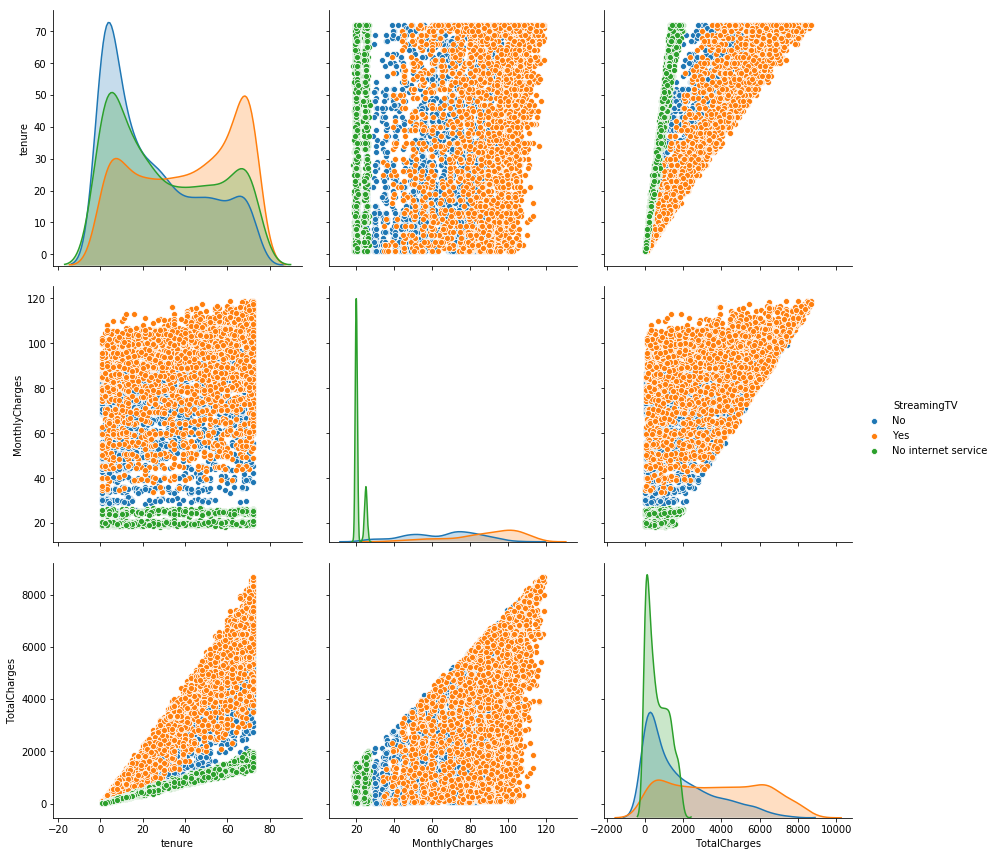

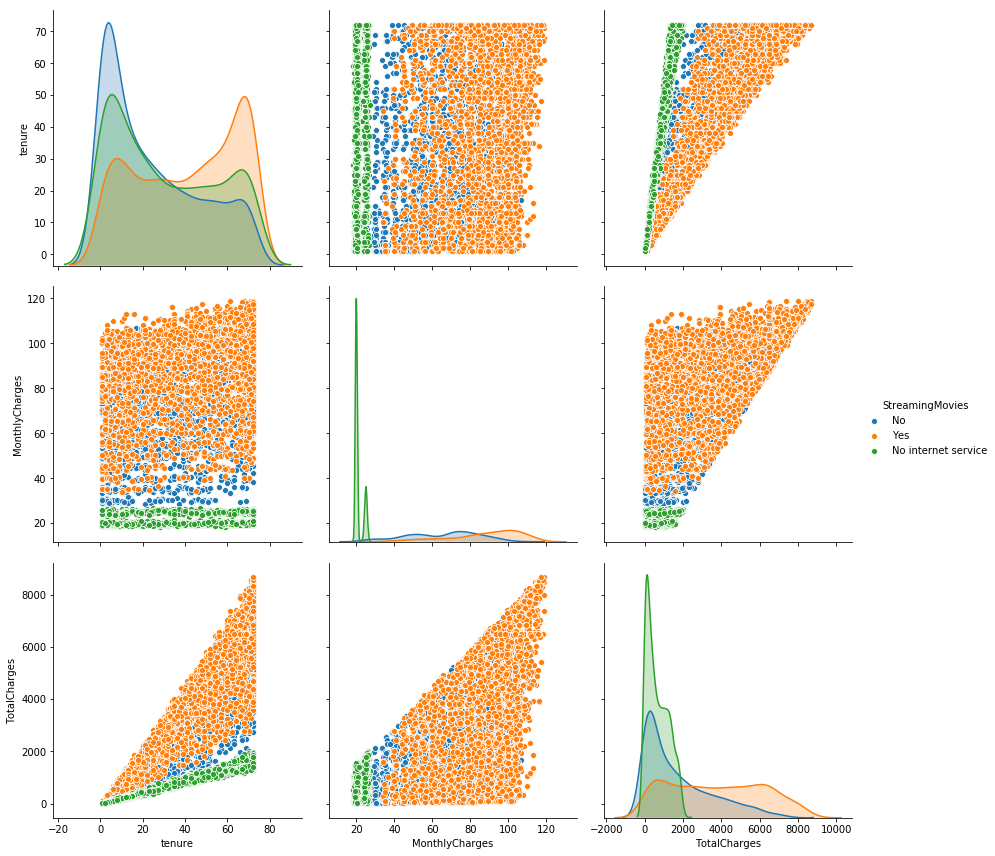

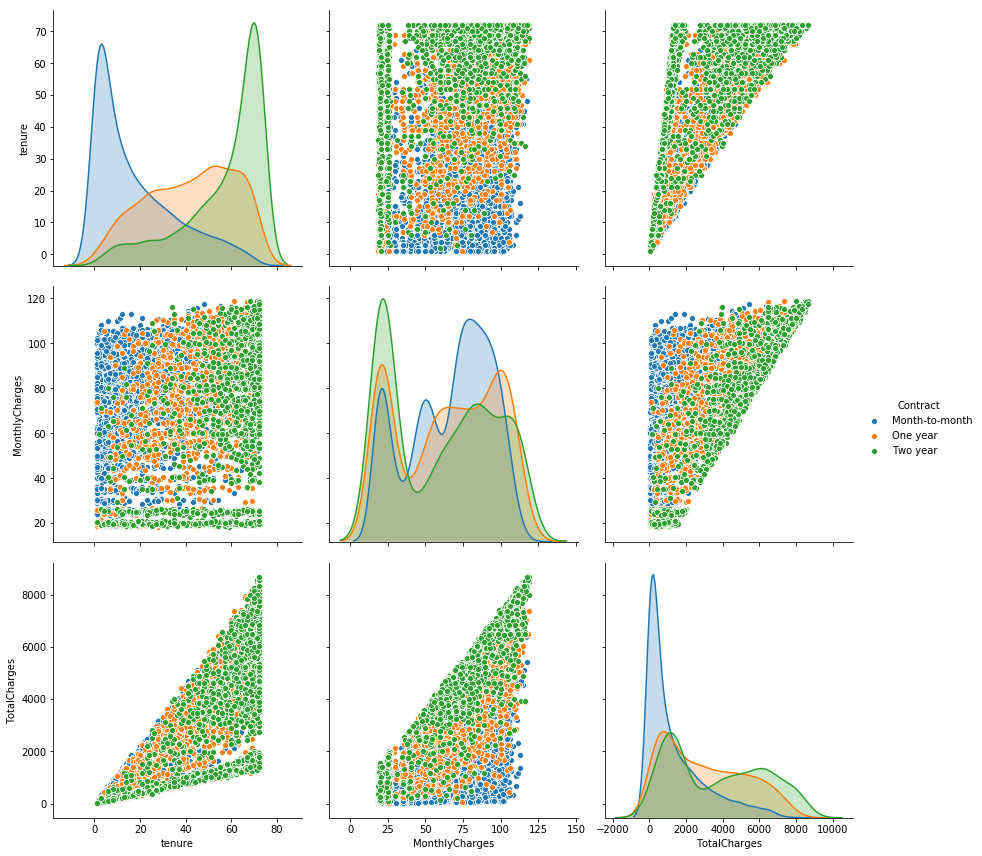

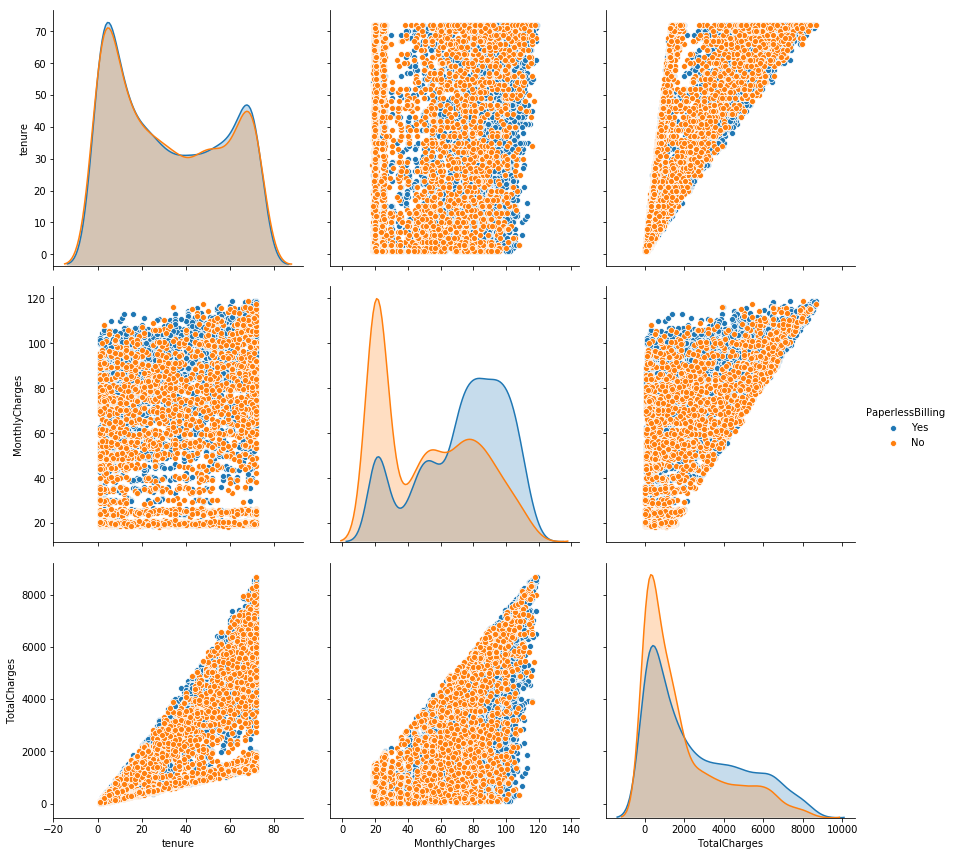

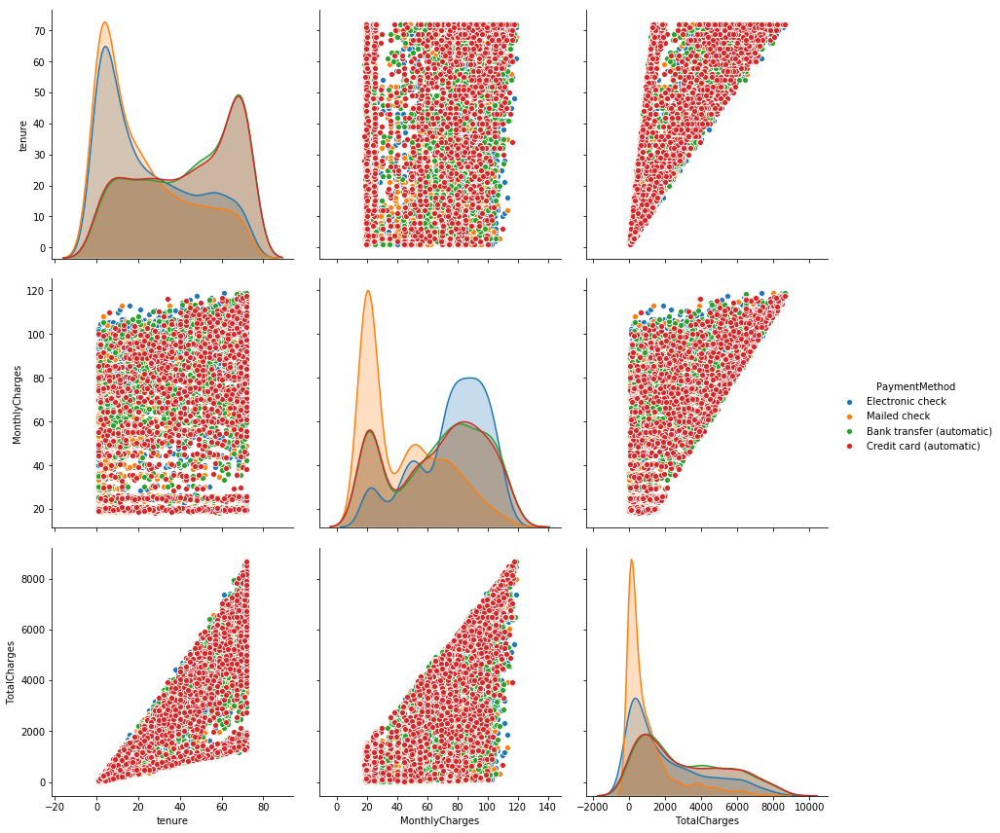

In [19]:
# Cambiamos una varible binaria a categórica para poder hacer el plot
churn['SeniorCitizen'] = churn['SeniorCitizen'].replace({1:"Yes",0:"No"})
for i in col_categoricas:
    sns.pairplot(churn[col_numericas + col_categoricas ], kind="scatter", diag_kind= 'kde',height=4, hue=i)
   

Una de las conclusiones a destacar tras el plot, es la modificación de las variables categoricas: `['OnlineSecurity','OnlineBackup','DeviceProtection','TechSupport','StreamingTV', 'StreamingMovies']`
Que tienen como variables `'Yes', 'No', 'No internet services'`, las cuales podemos reducirlas a `'Yes', 'No'`. Hemos decidido hacer esto debido a la cantidad y distribucíon de los datos.

## Exploración de Variables Categóricas

<img src="https://storage.cloud.google.com/mbdm-icemd/linea.png?authuser=1&supportedpurview=project">

Procederemos a la exploración de las variables categoricas, tomando como primera acción el cambio mencionado anteriormente y convirtiendo las varibales a numéricas:


In [20]:
churn[col_categoricas] = churn[col_categoricas].replace({"No internet service":"No"})
churn[col_categoricas] = churn[col_categoricas].replace({"No phone service":"No"})
churn[col_categoricas] = churn[col_categoricas].replace({"Female":1,"Male":0})
churn[col_categoricas] = churn[col_categoricas].replace({"Yes":1,"No":0})
churn[col_churn] = churn[col_churn].replace({"Yes":1,"No":0})

In [21]:
# Realizamos un Get dummies para las variables con mas de dos categorias
churn_dummies = pd.get_dummies(churn[col_numericas + col_categoricas + col_churn])
churn = (churn.loc[:,['customerID']]).join(churn_dummies)
col_categoricas = churn.nunique()[churn.nunique() == 2].keys()
col_categoricas

Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService',
       'MultipleLines', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
       'TechSupport', 'StreamingTV', 'StreamingMovies', 'PaperlessBilling',
       'Churn', 'InternetService_0', 'InternetService_DSL',
       'InternetService_Fiber optic', 'Contract_Month-to-month',
       'Contract_One year', 'Contract_Two year',
       'PaymentMethod_Bank transfer (automatic)',
       'PaymentMethod_Credit card (automatic)',
       'PaymentMethod_Electronic check', 'PaymentMethod_Mailed check'],
      dtype='object')

### Variables categóricas/Churn

In [22]:
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff
py.init_notebook_mode(connected=True)

dat_rad = churn_dummies[col_categoricas]


def plot_radar(df,aggregate,title) :
    data_frame = df[df["Churn"] == aggregate] 
    data_frame_x = data_frame[col_categoricas].sum().reset_index()
    data_frame_x.columns  = ["feature","yes"]
    data_frame_x["no"]    = data_frame.shape[0]  - data_frame_x["yes"]
    data_frame_x  = data_frame_x[data_frame_x["feature"] != "Churn"]
    
    #contamos los Yes que son 1
    trace1 = go.Scatterpolar(r = data_frame_x["yes"].values.tolist(),
                             theta = data_frame_x["feature"].tolist(),
                             fill  = "toself",name = "Yes",
                             mode = "markers+lines",
                             marker = dict(size = 5)
                            )
    #contamos los No que son 0
    trace2 = go.Scatterpolar(r = data_frame_x["no"].values.tolist(),
                             theta = data_frame_x["feature"].tolist(),
                             fill  = "toself",name = "No",
                             mode = "markers+lines",
                             marker = dict(size = 5)
                            ) 
    layout = go.Layout(dict(polar = dict(radialaxis = dict(visible = True,
                                                           side = "counterclockwise",
                                                           showline = True,
                                                           linewidth = 2,
                                                           tickwidth = 2,
                                                           gridcolor = "white",
                                                           gridwidth = 2),
                                         angularaxis = dict(tickfont = dict(size = 10),
                                                            layer = "below traces"
                                                           ),
                                         bgcolor  = "rgb(243,243,243)",
                                        ),
                            paper_bgcolor = "rgb(243,243,243)",
                            title = title,height = 700))
    
    data = [trace2,trace1]
    fig = go.Figure(data=data,layout=layout)
    py.iplot(fig)

#Ploteamos
plot_radar(dat_rad,1,"Churn")
plot_radar(dat_rad,0,"Non Churn")


/anaconda3/lib/python3.7/site-packages/dask/config.py:168: YAMLLoadWarning:

calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.



## Feature Ingeniering

<img src="https://storage.cloud.google.com/mbdm-icemd/linea.png?authuser=1&supportedpurview=project">

En este apartado generaremos nuevas dimensiones de las variables continuas:

In [23]:
from sklearn.preprocessing import PolynomialFeatures
pf = PolynomialFeatures(degree=2, interaction_only=False,  
                        include_bias=False)
features = pf.fit_transform(churn[col_numericas])
features

array([[1.00000000e+00, 2.98500000e+01, 2.98500000e+01, ...,
        8.91022500e+02, 8.91022500e+02, 8.91022500e+02],
       [3.40000000e+01, 5.69500000e+01, 1.88950000e+03, ...,
        3.24330250e+03, 1.07607025e+05, 3.57021025e+06],
       [2.00000000e+00, 5.38500000e+01, 1.08150000e+02, ...,
        2.89982250e+03, 5.82387750e+03, 1.16964225e+04],
       ...,
       [1.10000000e+01, 2.96000000e+01, 3.46450000e+02, ...,
        8.76160000e+02, 1.02549200e+04, 1.20027602e+05],
       [4.00000000e+00, 7.44000000e+01, 3.06600000e+02, ...,
        5.53536000e+03, 2.28110400e+04, 9.40035600e+04],
       [6.60000000e+01, 1.05650000e+02, 6.84450000e+03, ...,
        1.11619225e+04, 7.23121425e+05, 4.68471802e+07]])

Una vez generada una matriz de caracteristicas, miremos con que grados a jugado en cada columna para crear el dataframe

In [24]:
pd.DataFrame(pf.powers_, columns=['tenure_degree','MonthlyCharges_degree','TotalCharges_degree'])

,tenure_degree,MonthlyCharges_degree,TotalCharges_degree
0,1,0,0
1,0,1,0
2,0,0,1
3,2,0,0
4,1,1,0
5,1,0,1
6,0,2,0
7,0,1,1
8,0,0,2


In [25]:
col_features = ['tenure','MonthlyCharges','TotalCharges','tenure_2','tenure*MonthlyCharges','tenure*TotalCharges',
                'MonthlyCharges_2','MonthlyCharges*TotalCharges','TotalCharges*2']
churn_features = pd.DataFrame(features, columns = col_features)

# Añadimos algunas medias que nos parecen interesantes 
churn_features['MonthlyCharges_mean'] = churn_features['MonthlyCharges'].mean()
churn_features['tenure_mean'] = churn_features['tenure'].mean()

# Genreamos los dos cuerpos de matrices para el posterior modelado
churn_B = (churn.loc[:,['customerID']]).join((churn_features.join(churn[col_categoricas])))
churn_A = churn

#### Matriz A

En esta matriz hemos dejado las varibles continuas sin manipular, adjuntando sus variables categoricas que anteriormemte hemos tratato.

In [26]:
churn_A.head()

,customerID,tenure,MonthlyCharges,TotalCharges,gender,SeniorCitizen,Partner,Dependents,PhoneService,MultipleLines,...,InternetService_0,InternetService_DSL,InternetService_Fiber optic,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,7590-VHVEG,1.0,29.85,29.85,1,0,1,0,0,0,...,0,1,0,1,0,0,0,0,1,0
1,5575-GNVDE,34.0,56.95,1889.50,0,0,0,0,1,0,...,0,1,0,0,1,0,0,0,0,1
2,3668-QPYBK,2.0,53.85,108.15,0,0,0,0,1,0,...,0,1,0,1,0,0,0,0,0,1
3,7795-CFOCW,45.0,42.30,1840.75,0,0,0,0,0,0,...,0,1,0,0,1,0,1,0,0,0
4,9237-HQITU,2.0,70.70,151.65,1,0,0,0,1,0,...,0,0,1,1,0,0,0,0,1,0


In [27]:
churn_A.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 28 columns):
customerID                                 7032 non-null object
tenure                                     7032 non-null float64
MonthlyCharges                             7032 non-null float64
TotalCharges                               7032 non-null float64
gender                                     7032 non-null int64
SeniorCitizen                              7032 non-null int64
Partner                                    7032 non-null int64
Dependents                                 7032 non-null int64
PhoneService                               7032 non-null int64
MultipleLines                              7032 non-null int64
OnlineSecurity                             7032 non-null int64
OnlineBackup                               7032 non-null int64
DeviceProtection                           7032 non-null int64
TechSupport                                7032 non-null int64
Stre

#### Matriz B

En esta matriz hemos jugado con las variables continuas añadiendo medias y combinaciones lineas de estas. Además de las variables categóricas.

In [28]:
churn_B.head()

,customerID,tenure,MonthlyCharges,TotalCharges,tenure_2,tenure*MonthlyCharges,tenure*TotalCharges,MonthlyCharges_2,MonthlyCharges*TotalCharges,TotalCharges*2,...,InternetService_0,InternetService_DSL,InternetService_Fiber optic,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,7590-VHVEG,1.0,29.85,29.85,1.0,29.85,29.85,891.0225,891.0225,8.910225e+02,...,0,1,0,1,0,0,0,0,1,0
1,5575-GNVDE,34.0,56.95,1889.50,1156.0,1936.30,64243.00,3243.3025,107607.0250,3.570210e+06,...,0,1,0,0,1,0,0,0,0,1
2,3668-QPYBK,2.0,53.85,108.15,4.0,107.70,216.30,2899.8225,5823.8775,1.169642e+04,...,0,1,0,1,0,0,0,0,0,1
3,7795-CFOCW,45.0,42.30,1840.75,2025.0,1903.50,82833.75,1789.2900,77863.7250,3.388361e+06,...,0,1,0,0,1,0,1,0,0,0
4,9237-HQITU,2.0,70.70,151.65,4.0,141.40,303.30,4998.4900,10721.6550,2.299772e+04,...,0,0,1,1,0,0,0,0,1,0


In [29]:
churn_B.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 36 columns):
customerID                                 7032 non-null object
tenure                                     7032 non-null float64
MonthlyCharges                             7032 non-null float64
TotalCharges                               7032 non-null float64
tenure_2                                   7032 non-null float64
tenure*MonthlyCharges                      7032 non-null float64
tenure*TotalCharges                        7032 non-null float64
MonthlyCharges_2                           7032 non-null float64
MonthlyCharges*TotalCharges                7032 non-null float64
TotalCharges*2                             7032 non-null float64
MonthlyCharges_mean                        7032 non-null float64
tenure_mean                                7032 non-null float64
gender                                     7032 non-null int64
SeniorCitizen                              7032 non

## Nomalizacion, distribución y correlacion de las variables.

<img src="https://storage.cloud.google.com/mbdm-icemd/linea.png?authuser=1&supportedpurview=project">

Uno de los fallos mas habituales es dar a la maquina datos no escalados. Esto entorpeceria el aprendizaje de la maquina debido al peso de las varibales de alto valor, dejando aun lado la importancia casi de las variables categóricas. Por ello es necesario realziar un escalado a corde al dataset. Otro punto importantes es ver las correlaciones de las variables para ver si estamos dando la misma información.

### Matriz A

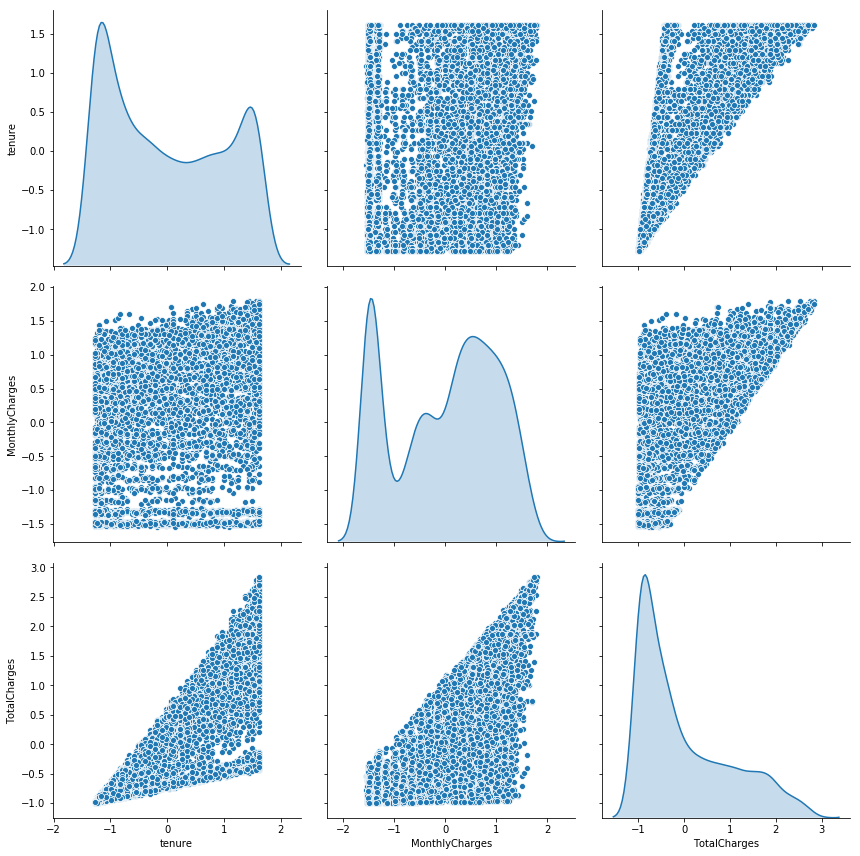

In [30]:
from sklearn.preprocessing import StandardScaler
std = StandardScaler()
norm_churn_A = std.fit_transform(churn_A[col_numericas])
norm_churn_A = pd.DataFrame(norm_churn_A,columns=col_numericas)
sns.pairplot(norm_churn_A, kind="scatter", diag_kind= 'kde',height=4)

In [31]:
churn_A_final = (churn_A.loc[:,['customerID']]).join((norm_churn_A.join(churn_A[col_categoricas])))
churn_A_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 28 columns):
customerID                                 7032 non-null object
tenure                                     7032 non-null float64
MonthlyCharges                             7032 non-null float64
TotalCharges                               7032 non-null float64
gender                                     7032 non-null int64
SeniorCitizen                              7032 non-null int64
Partner                                    7032 non-null int64
Dependents                                 7032 non-null int64
PhoneService                               7032 non-null int64
MultipleLines                              7032 non-null int64
OnlineSecurity                             7032 non-null int64
OnlineBackup                               7032 non-null int64
DeviceProtection                           7032 non-null int64
TechSupport                                7032 non-null int64
Stre

In [32]:
#Preparamos el frame de correlaciones
correlation = churn_A_final.corr()
#Extraemos el nombre de las columnas
matrix_cols = correlation.columns.tolist()
#convertimos el frame en array
corr_array  = np.array(correlation)

#Visualizacion de datos con plotly
trace = go.Heatmap(z = corr_array,
                   x = matrix_cols,
                   y = matrix_cols,
                   colorscale = [[0.0, 'rgb(165,0,38)'], [0.1111111111111111, 'rgb(215,48,39)'], [0.2222222222222222, 'rgb(244,109,67)'],
        [0.3333333333333333, 'rgb(253,174,97)'], [0.4444444444444444, 'rgb(254,224,144)'], [0.5555555555555556, 'rgb(224,243,248)'],
        [0.6666666666666666, 'rgb(171,217,233)'],[0.7777777777777778, 'rgb(116,173,209)'], [0.8888888888888888, 'rgb(69,117,180)'],
        [1.0, 'rgb(49,54,149)']],
                   colorbar   = dict(title = "Pearson Correlation coefficient",
                                     titleside = "right"
                                    ) ,
                  )

layout = go.Layout(dict(title = "Matriz A de correlaciones",
                        autosize = False,
                        height  = 720,
                        width   = 800,
                        margin  = dict(r = 0 ,l = 210,
                                       t = 25,b = 210,
                                      ),
                        yaxis   = dict(tickfont = dict(size = 9)),
                        xaxis   = dict(tickfont = dict(size = 9))
                       )
                  )

data = [trace]
fig = go.Figure(data=data,layout=layout)
py.iplot(fig)

### Matriz B

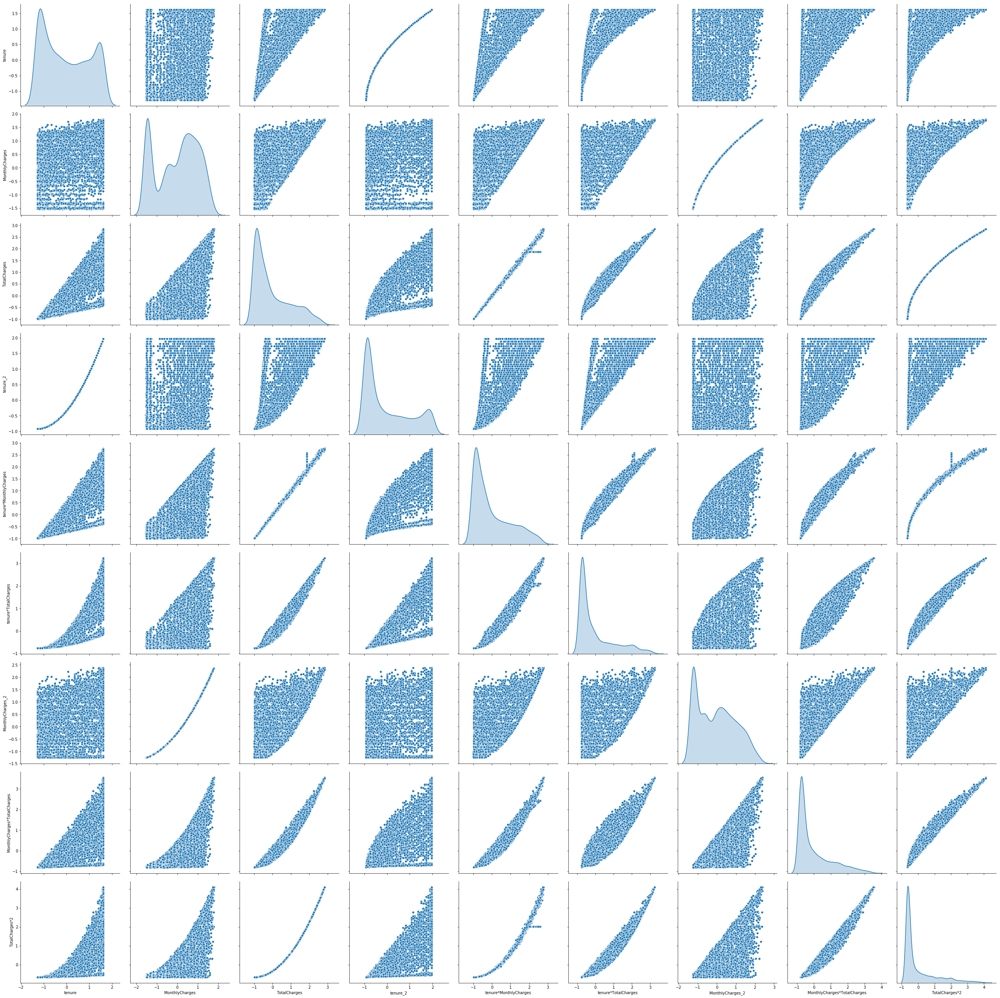

In [33]:
from sklearn.preprocessing import StandardScaler
std = StandardScaler()
norm_churn_B = std.fit_transform(churn_B[col_features])
norm_churn_B = pd.DataFrame(norm_churn_B,columns=col_features)
sns.pairplot(norm_churn_B, kind="scatter", diag_kind= 'kde',height=4)

In [34]:
churn_B_final = (churn_B.loc[:,['customerID']]).join((norm_churn_B.join(churn_B[col_categoricas])))
churn_B_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 34 columns):
customerID                                 7032 non-null object
tenure                                     7032 non-null float64
MonthlyCharges                             7032 non-null float64
TotalCharges                               7032 non-null float64
tenure_2                                   7032 non-null float64
tenure*MonthlyCharges                      7032 non-null float64
tenure*TotalCharges                        7032 non-null float64
MonthlyCharges_2                           7032 non-null float64
MonthlyCharges*TotalCharges                7032 non-null float64
TotalCharges*2                             7032 non-null float64
gender                                     7032 non-null int64
SeniorCitizen                              7032 non-null int64
Partner                                    7032 non-null int64
Dependents                                 7032 non-nul

In [35]:
#Preparamos el frame de correlaciones
correlation = churn_B_final.corr()
#Extraemos el nombre de las columnas
matrix_cols = correlation.columns.tolist()
#convertimos el frame en array
corr_array  = np.array(correlation)

#Visualizacion de datos con plotly
trace = go.Heatmap(z = corr_array,
                   x = matrix_cols,
                   y = matrix_cols,
                   colorscale = [[0.0, 'rgb(165,0,38)'], [0.1111111111111111, 'rgb(215,48,39)'], [0.2222222222222222, 'rgb(244,109,67)'],
        [0.3333333333333333, 'rgb(253,174,97)'], [0.4444444444444444, 'rgb(254,224,144)'], [0.5555555555555556, 'rgb(224,243,248)'],
        [0.6666666666666666, 'rgb(171,217,233)'],[0.7777777777777778, 'rgb(116,173,209)'], [0.8888888888888888, 'rgb(69,117,180)'],
        [1.0, 'rgb(49,54,149)']],
                   colorbar   = dict(title = "Pearson Correlation coefficient",
                                     titleside = "right"
                                    ) ,
                  )

layout = go.Layout(dict(title = "Matriz B de correlaciones",
                        autosize = False,
                        height  = 720,
                        width   = 800,
                        margin  = dict(r = 0 ,l = 210,
                                       t = 25,b = 210,
                                      ),
                        yaxis   = dict(tickfont = dict(size = 9)),
                        xaxis   = dict(tickfont = dict(size = 9))
                       )
                  )

data = [trace]
fig = go.Figure(data=data,layout=layout)
py.iplot(fig)

Podemos observar como en la matriz de correlaciones aparece nuestro feature engineering, marcandonos con un color mas azul estas variables correlacionadas.

## Train and Test

<img src="https://storage.cloud.google.com/mbdm-icemd/linea.png?authuser=1&supportedpurview=project">

Antes de empezar a lanzar los modelos debemos separar nuestros datos de entrenamiento y testing.

In [36]:
from sklearn.model_selection import train_test_split
train_A,test_A = train_test_split(churn_A_final, test_size = .25 ,random_state = 111)
train_B,test_B = train_test_split(churn_B_final, test_size = .25 ,random_state = 111)

A continuacion separamos las variables a predecir y col_id que no interviene en nuestro entrenamiento

In [37]:
# Matriz A
cols_A    = [i for i in churn_A_final.columns if i not in col_id + col_churn]
train_XA = train_A[cols_A]
train_YA = train_A[col_churn]
test_XA  = test_A[cols_A]
test_YA  = test_A[col_churn]

# Matriz B
cols_B    = [i for i in churn_B_final.columns if i not in col_id + col_churn]
train_XB = train_B[cols_B]
train_YB = train_B[col_churn]
test_XB  = test_B[cols_B]
test_YB  = test_B[col_churn]

Preparamos una funcion que nos enseñe las carecteristicas importantes de cada entrenamiento, para posteriromente comparar y sacar conclusiones

In [38]:
from sklearn.metrics import confusion_matrix,accuracy_score
from sklearn.metrics import roc_auc_score,roc_curve,scorer
import statsmodels.api as sm

def churn_prediction(algoritmo, training_x, testing_x, training_y, testing_y):
    algoritmo.fit(training_x,training_y)
    prediccion   = algoritmo.predict(testing_x)
    probabilidad = algoritmo.predict_proba(testing_x)
    conf_matrix = confusion_matrix(testing_y,prediccion)
    model_roc_auc = roc_auc_score(testing_y,prediccion)
    fpr,tpr,thresholds = roc_curve(testing_y,probabilidad[:,1])
    
    print (algoritmo)
    print ("Accuracy   Score : ",accuracy_score(testing_y,prediccion))
    print ("Area bajo la curva : ",model_roc_auc,"\n")
    
    #Curva ROC
    grafico1 = go.Scatter(x = fpr,y = tpr,
                        name = "ROC : " + str(model_roc_auc),
                        line = dict(color = ('rgb(22, 96, 167)'),width = 2),
                       )
    grafico1B = go.Scatter(x = [0,1],y=[0,1],
                        line = dict(color = ('rgb(205, 12, 24)'),width = 2,
                        dash = 'dot'))
    
    #plot confusion matrix
    grafico2 = go.Heatmap(z = conf_matrix ,x = ["Not churn","Churn"],
                        y = ["Not churn","Churn"],
                        showscale  = False,colorscale = [[0.0, 'rgb(165,0,38)'], [0.1111111111111111, 'rgb(215,48,39)'], [0.2222222222222222, 'rgb(244,109,67)'],
        [0.3333333333333333, 'rgb(253,174,97)'], [0.4444444444444444, 'rgb(254,224,144)'], [0.5555555555555556, 'rgb(224,243,248)'],
        [0.6666666666666666, 'rgb(171,217,233)'],[0.7777777777777778, 'rgb(116,173,209)'], [0.8888888888888888, 'rgb(69,117,180)'],
        [1.0, 'rgb(49,54,149)']],name = "matrix",
                        xaxis = "x2",yaxis = "y2"
                       )
    
    layout = go.Layout(dict(title="Caracteristicas del modelo" ,
                            autosize = False,height = 600,width = 900,
                            showlegend = False,
                            plot_bgcolor  = "rgb(243,243,243)",
                            paper_bgcolor = "rgb(243,243,243)",
                            xaxis = dict(title = "Ratio falso positivo",
                                         gridcolor = 'rgb(255, 255, 255)',
                                         domain=[0, 0.6],
                                         ticklen=5,gridwidth=2),
                            yaxis = dict(title = "Ratio verdadero positivo",
                                         gridcolor = 'rgb(255, 255, 255)',
                                         zerolinewidth=1,
                                         ticklen=5,gridwidth=2),
                            margin = dict(b=200),
                            xaxis2=dict(domain=[0.7, 1],tickangle = 90,
                                        gridcolor = 'rgb(255, 255, 255)'),
                            yaxis2=dict(anchor='x2',gridcolor = 'rgb(255, 255, 255)')
                           )
                  )
    data = [grafico1,grafico1B,grafico2]
    fig = go.Figure(data=data,layout=layout)
    
    py.iplot(fig)

   

## Modelos

<img src="https://storage.cloud.google.com/mbdm-icemd/linea.png?authuser=1&supportedpurview=project">

Para este apartado se a decidido utilizar los modelos mas utilizados hoy en dia, los cuales son:
* LogisticRegression
* RandomForestClassifier
* GaussianNB
* XGBClassifier

### LogisticRegression

In [39]:
from sklearn.linear_model import LogisticRegression

LogisticRegression  = LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

churn_prediction(LogisticRegression, train_XA, test_XA, train_YA, test_YA)
churn_prediction(LogisticRegression, train_XB, test_XB, train_YB, test_YB)


/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)
Accuracy   Score :  0.8020477815699659
Area bajo la curva :  0.72190658597824 



LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)
Accuracy   Score :  0.8100113765642776
Area bajo la curva :  0.7311836090903239 



/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



### RandomForest

In [40]:
from sklearn.ensemble import RandomForestClassifier

RandomForestClassifier =RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
                                               max_depth=3, max_features='auto', max_leaf_nodes=None,
                                               min_impurity_decrease=0.0, min_impurity_split=None,
                                               min_samples_leaf=1, min_samples_split=2,
                                               min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
                                               oob_score=False, random_state=None, verbose=0,
                                               warm_start=False)
churn_prediction(RandomForestClassifier, train_XA, test_XA, train_YA, test_YA)
churn_prediction(RandomForestClassifier, train_XB, test_XB, train_YB, test_YB)

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
            max_depth=3, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)
Accuracy   Score :  0.773037542662116
Area bajo la curva :  0.6260397218824438 



/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
            max_depth=3, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)
Accuracy   Score :  0.7775881683731513
Area bajo la curva :  0.6429681967424193 



### Gaussian NB

In [41]:
from sklearn.naive_bayes import GaussianNB
GaussianNB = GaussianNB(priors=None)
churn_prediction(GaussianNB, train_XA, test_XA, train_YA, test_YA)
churn_prediction(GaussianNB, train_XB, test_XB, train_YB, test_YB)

GaussianNB(priors=None, var_smoothing=1e-09)
Accuracy   Score :  0.7582480091012515
Area bajo la curva :  0.7654220047640508 



/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



GaussianNB(priors=None, var_smoothing=1e-09)
Accuracy   Score :  0.7531285551763367
Area bajo la curva :  0.7656296272452199 



/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



### XGBoost Classifier

In [42]:
from xgboost import XGBClassifier

XGBClassifier = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
                    colsample_bytree=1, gamma=0, learning_rate=0.9, max_delta_step=0,
                    max_depth = 7, min_child_weight=1, missing=None, n_estimators=100,
                    n_jobs=1, nthread=None, objective='binary:logistic', random_state=0,
                    reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
                    silent=True, subsample=1)

churn_prediction(XGBClassifier, train_XA, test_XA, train_YA, test_YA)
churn_prediction(XGBClassifier, train_XB, test_XB, train_YB, test_YB)

/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:219: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:252: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.9,
       max_delta_step=0, max_depth=7, min_child_weight=1, missing=None,
       n_estimators=100, n_jobs=1, nthread=None,
       objective='binary:logistic', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
       subsample=1, verbosity=1)
Accuracy   Score :  0.7713310580204779
Area bajo la curva :  0.6887175690465461 



/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:219: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:252: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.9,
       max_delta_step=0, max_depth=7, min_child_weight=1, missing=None,
       n_estimators=100, n_jobs=1, nthread=None,
       objective='binary:logistic', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
       subsample=1, verbosity=1)
Accuracy   Score :  0.7741751990898749
Area bajo la curva :  0.6925674370694651 



## Conclusion

<img src="https://storage.cloud.google.com/mbdm-icemd/linea.png?authuser=1&supportedpurview=project">

Tras visualizar los graficos de los modelos, llegamos a la conclusion que el mejor algoritmo para este caso es la **LogisticRegression**, para la matriz B, dandonos los siguientes resultados:

Accuracy   Score :  0.8100113765642776
Area bajo la curva :  0.7311836090903239

Cabe descatar que el feature engeniering ha mejorado los resultados respecto a la matriz A, muy poco, pero la mejora ha sido buena. Recalco, que este resultado puede mejorarse si se estudia la posibilidad de mayores combinaciones lineales entre las variables continuas. Además, los algoritmos que hemos probado, han sido con parametros sencillos, podría caber la posibilidad que los algoritmos como el XGBoost o el RamdomForest superen este score jugando con sus hyperparametros.